<a href="https://colab.research.google.com/github/Geebss/Swimming_ObjectDetection/blob/main/CSI4130Project_RyanGeheb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Begin by installing YOLOv5 and by importing assets from Google Colab
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt #Probably the most important line that solved
                                  #most of my issues... set all assets to the compatible versions,
                                  #something I had struggled with previously
%pip install -q roboflow

import torch
import os

Cloning into 'yolov5'...
remote: Enumerating objects: 12264, done.
remote: Counting objects: 100% (35/35), done.
remote: Compressing objects: 100% (22/22), done.
remote: Total 12264 (delta 18), reused 22 (delta 13), pack-reused 12229
Receiving objects: 100% (12264/12264), 12.01 MiB | 24.79 MiB/s, done.
Resolving deltas: 100% (8488/8488), done.
/content/yolov5
     |████████████████████████████████| 596 kB 5.3 MB/s 
     |████████████████████████████████| 145 kB 5.3 MB/s 
     |████████████████████████████████| 178 kB 46.0 MB/s 
     |████████████████████████████████| 1.1 MB 43.6 MB/s 
     |████████████████████████████████| 67 kB 5.7 MB/s 
     |████████████████████████████████| 54 kB 2.7 MB/s 
     |████████████████████████████████| 138 kB 49.6 MB/s 
     |████████████████████████████████| 62 kB 1.5 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-

In [ ]:
#import assets for training data

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ML3jXAvfXY1XfEklL5VY")
project = rf.workspace().project("swimmer-detection-rxtkk")
dataset = project.version(2).download("yolov5")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Swimmer-Detection-2 in yolov5pytorch:: 100%|██████████| 524/524 [00:00<00:00, 837.42it/s]


In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
!python train.py --img 221 --batch 16 --epochs 50 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/yolov5/Swimmer-Detection-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=221, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-253-g75bbaa8 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/Swimmer-Detection-2/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-253-g75bbaa8 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients
image 1/12 /content/yolov5/Swimmer-Detection-2/test/images/IMG_0476_MOV-105_jpg.rf.4819afc73c67c31eb2bbc5e3fcd390a0.jpg: 416x416 1 Swimmer, Done. (0.011s)
image 2/12 /content/yolov5/Swimmer-Detection-2/test/images/IMG_0476_MOV-114_jpg.rf.58fdf368eb818ba5e51252d5d2a0b025.jpg: 416x416 2 Swimmers, Done. (0.011s)
image 3/12 /content/yol

In [ ]:
#Generate tensorboard to evaluate effectiveness of models through epochs
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

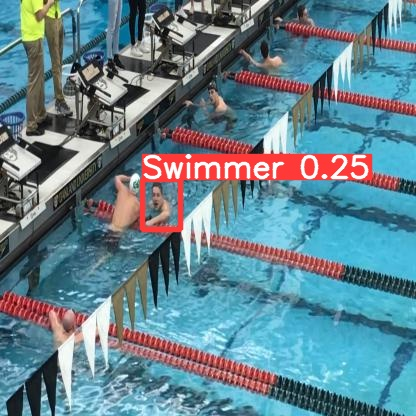

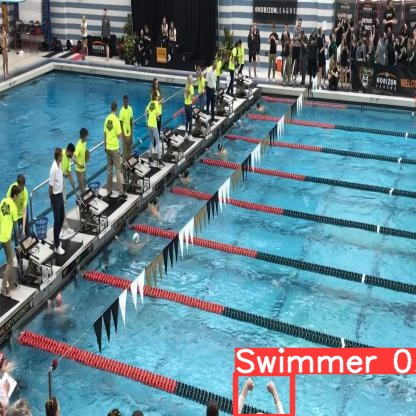

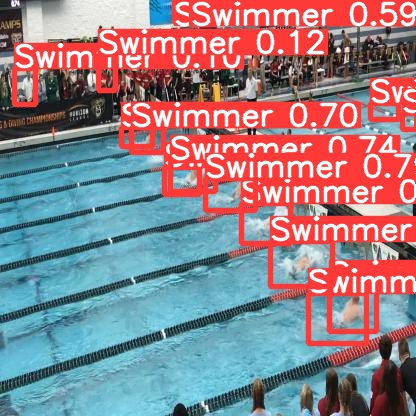

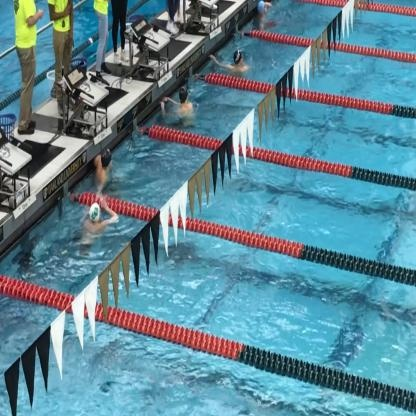

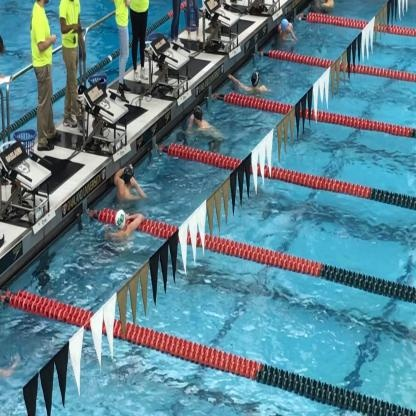

...

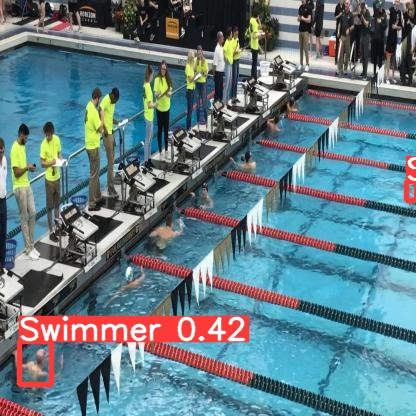

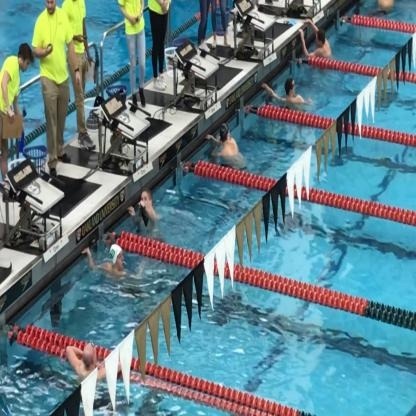

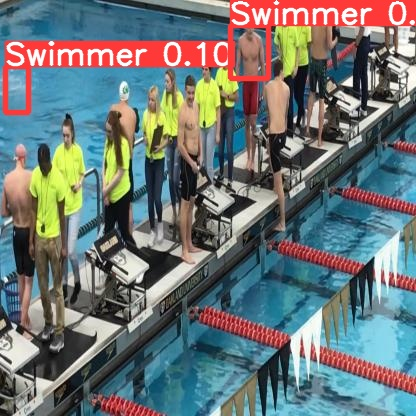

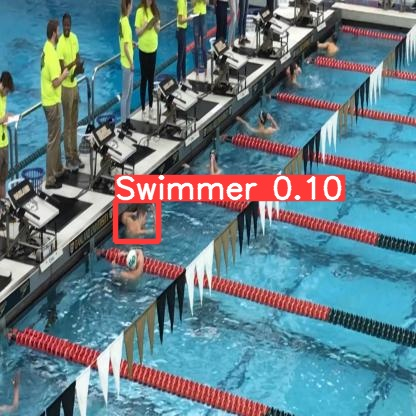

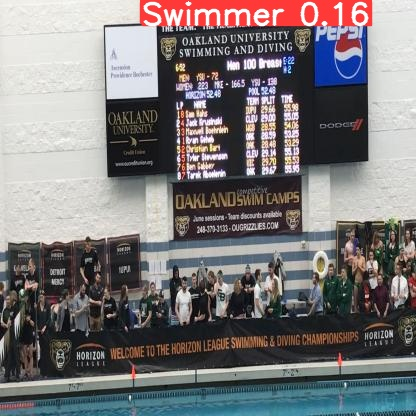

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")